In [1]:
import osmnx as ox, networkx as nx, matplotlib.cm as cm, pandas as pd, numpy as np
import geopandas as gpd
from shapely.geometry import Point, mapping
%matplotlib inline

import warnings
warnings.simplefilter(action="ignore")

pd.set_option('precision', 5)
pd.options.display.float_format = '{:20.2f}'.format
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.mode.chained_assignment = None

import urbanFormPy as up

### Downloading

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *OSMpolygon*, provide an OSM polygon (relation) name.
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)

In [2]:
place = ''
epsg = 26986
city_name = 'Torino'
crs = {'init': 'epsg:32632', 'no_defs': True}

download_method = 'OSMplace'
distance = None
nodes_graph, edges_graph = up.get_network_fromOSM(download_method, place, 'walk', epsg, distance = distance)

In [6]:
"""
- "same_uv_edges" regulates the handling of edges with same pair of u-v nodes but different geometries.
When true keeps a center line between the two segments, unless one of the two segments is significantly longer than 
the other (>30%). In this case, the longer segment is deleted.
"""
nodes_graph, edges_graph = up.clean_network(nodes_graph, edges_graph, dead_ends = True, remove_disconnected_islands = True,
                            self_loops = True, same_uv_edges = True)

Done after  1  cleaning cycles


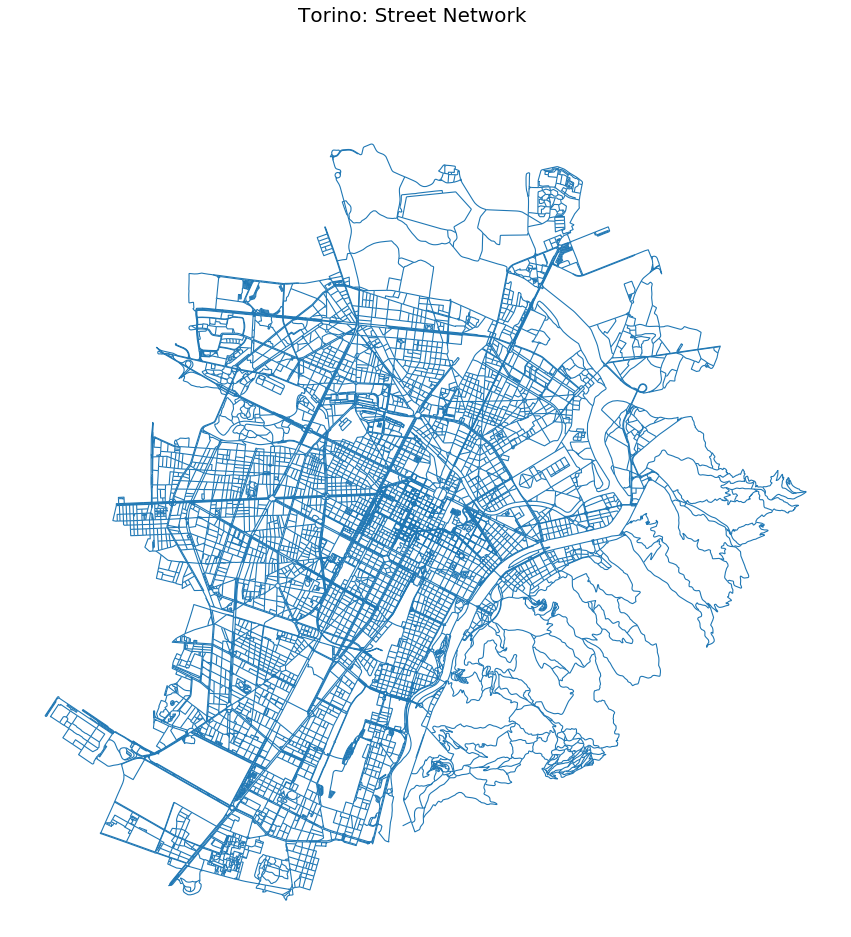

In [5]:
up.plot_lines(edges_graph, scheme = None,
              black_background = False, fig_size = 15, title = city_name+': Street Network')

In [7]:
# saving
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
nodes_graph.to_file(saving_path+city_name+'_nodes.shp')
edges_graph.to_file(saving_path+city_name+'_edges.shp')

### Alternatively, load from local path

In [183]:
place = 'Torino'
epsg = 32632
city_name = 'Torino'
crs = {'init': 'epsg:32632', 'no_defs': True}

loading_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
nodes_graph = gpd.read_file(loading_path+city_name+'_nodes_simplified.shp')
edges_graph = gpd.read_file(loading_path+city_name+'_edges_simplified.shp')

try:
    nodes_graph, edges_graph = nodes_graph.to_crs(epsg=epsg), edges_graph.to_crs(epsg=epsg)
except:
    nodes_graph.crs, edges_graph.crs = crs, crs

nodes_graph.index,edges_graph.index  = nodes_graph.nodeID, edges_graph.edgeID
nodes_graph.index.name, edges_graph.index.name  = None, None

## Simplifying

In [8]:
nodes_graph, edges_graph = up. simplify_pipeline(nodes_graph, edges_graph, radius = 12)

Done after  1  cleaning cycles
Done after  3  cleaning cycles
Done after  5  cleaning cycles
Done after  2  cleaning cycles
Simplifying dual lines: First part - clusters
Assigning centroids coordinates
Done after  4  cleaning cycles
Simplifying dual lines: Second part - nodes
Assigning centroids coordinates
Done after  4  cleaning cycles
Done after  3  cleaning cycles
Done after  2  cleaning cycles


In [9]:
# saving simplified network
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
nodes_graph.to_file(saving_path+city_name+'_nodes_simplified.shp')
edges_graph.to_file(saving_path+city_name+'_edges_simplified.shp')

# 1. Barriers identification

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)

In [10]:
download_method = 'OSMplace'
place = 'Torino'
envelope = edges_graph.unary_union.envelope
coords = mapping(envelope)["coordinates"][0]
d = [(Point(coords[0])).distance(Point(coords[1])), (Point(coords[1])).distance(Point(coords[2]))]
distance = max(d)

In [11]:
road_barriers = up.road_barriers(place, download_method, distance, crs, include_primary = True)
waterway_barriers = up.waterway_barriers(place, download_method, distance, crs)
railway_barriers = up.railway_barriers(place,download_method, distance, crs)
park_barriers = up.park_barriers(place,download_method, distance, crs, min_area = 20000)

In [12]:
barriers = road_barriers.append(waterway_barriers)
barriers = railway_barriers.append(barriers)
barriers = park_barriers.append(barriers)
barriers.reset_index(inplace = True, drop = True)
barriers['barrierID'] = barriers.index.astype(int)

### Visualisation

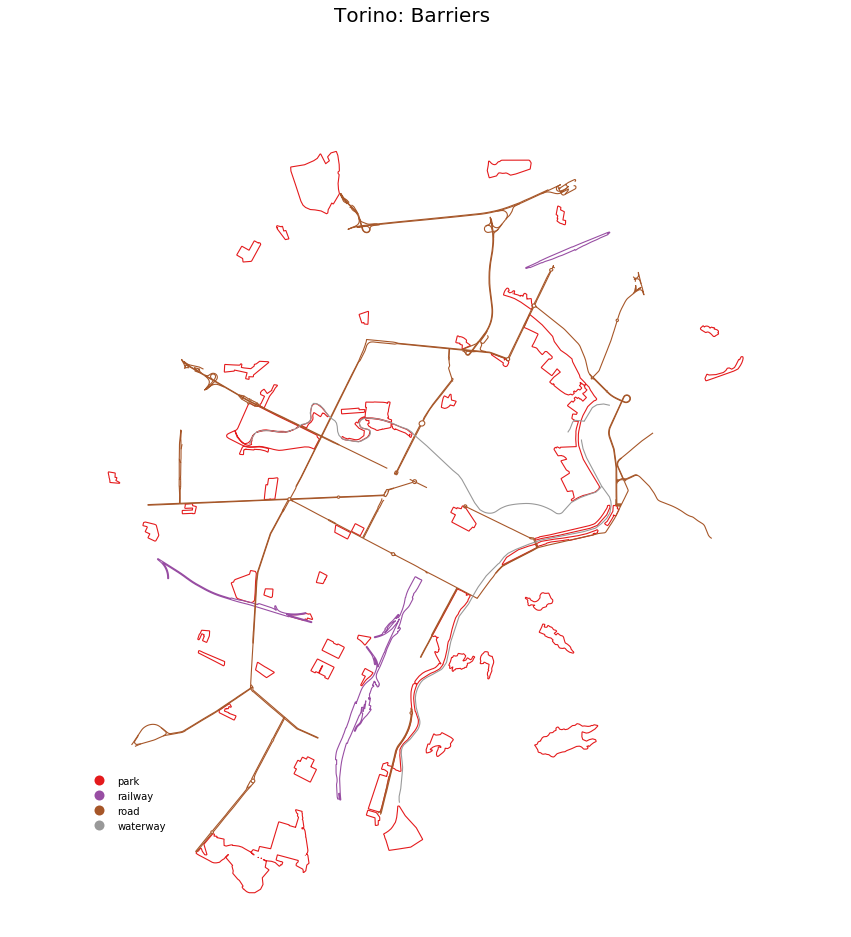

In [13]:
up.plot_lines(barriers, cmap = 'Set1', column = 'type',
              black_background = False, fig_size = 15, title = place+': Barriers', legend = True)

In [14]:
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
barriers.to_file(saving_path+city_name+"_barriers.shp", driver='ESRI Shapefile')

## Assigning barriers to street segments

In [5]:
loading_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
barriers= gpd.read_file(loading_path+city_name+"_barriers.shp", driver='ESRI Shapefile')

In [15]:
sindex = edges_graph.sindex
barriers_within = barriers[barriers.intersects(envelope)]

# along barriers 
tmp = barriers_within[barriers_within['type'].isin(['waterway', 'park'])]
edges_graph['p_barr'] = edges_graph.apply(lambda row: up.barriers_along(row['edgeID'], tmp, edges_graph, sindex,
                                                                                 offset = 200), axis = 1)
# along negative barriers                                    
tmp = barriers_within[barriers_within['type'].isin(['railway', 'road'])]
edges_graph['n_barr'] = edges_graph.apply(lambda row: up.barriers_along(row['edgeID'], tmp, edges_graph, sindex,
                                            offset = 50), axis = 1)

In [16]:
# crossing any kind of barrier
tmp = barriers_within[barriers_within['type'] != 'park'].copy()
edges_graph['c_barr'] = edges_graph.apply(lambda row: up.crossing_barriers(row['geometry'], tmp ), axis = 1)
edges_graph['sep_barr'] = edges_graph.apply(lambda row: True if len(row['c_barr']) > 0 else False, axis = 1)

In [17]:
tmp['type'].unique()

array(['railway', 'road', 'waterway'], dtype=object)

### Visualisation

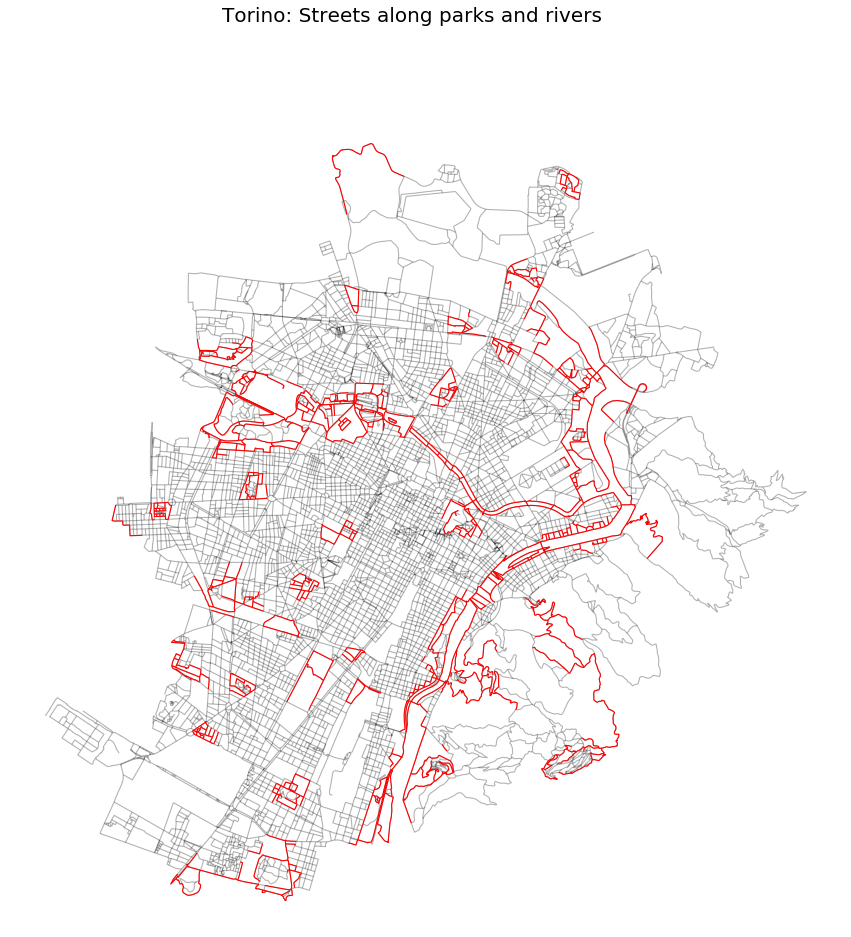

In [18]:
edges_graph['rivers_parks'] = edges_graph.apply(lambda row: True if len(row['p_barr']) > 0 else False, axis = 1)
tmp = edges_graph[edges_graph.rivers_parks == True].copy()
up.plot_lines(tmp, black_background = False, fig_size = 15, color = 'red', title = place+': Streets along parks and rivers', 
              legend = False, gdf_base_map = edges_graph, base_map_alpha = 0.3)

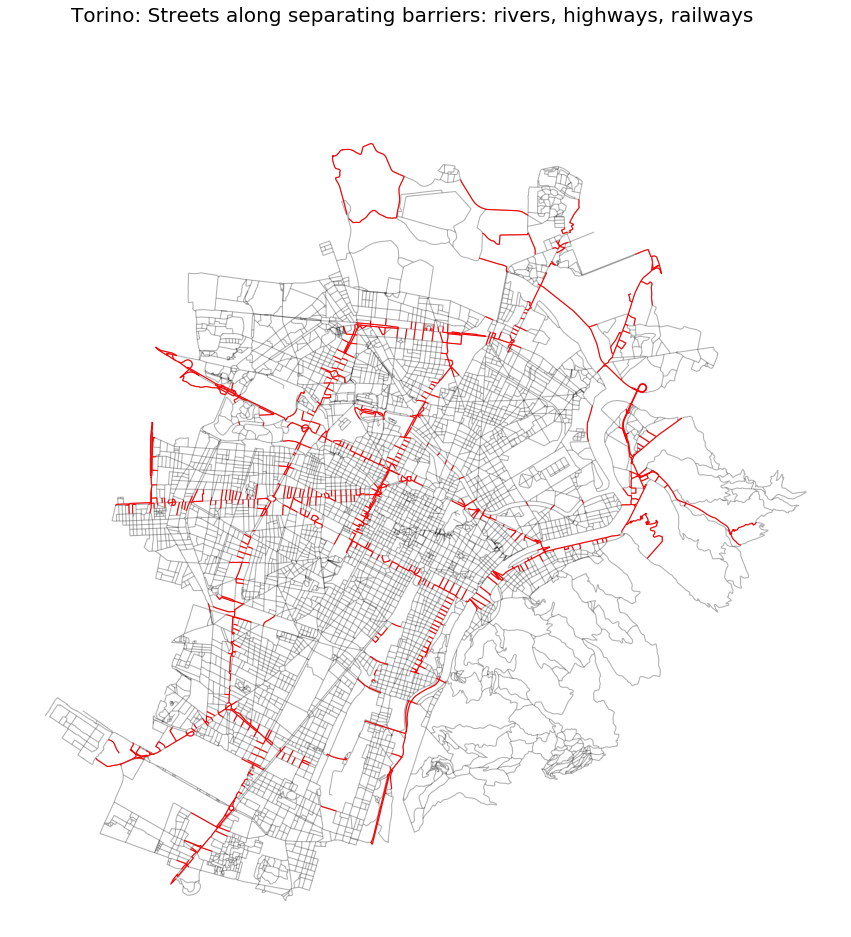

In [19]:
tmp = edges_graph[edges_graph.sep_barr == True].copy()
up.plot_lines(tmp, black_background = False, fig_size = 15,  color = 'red', 
              title = place+': Streets along separating barriers: rivers, highways, railways',
              gdf_base_map = edges_graph, base_map_alpha = 0.3, legend = False)

In [17]:
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
to_convert = ['p_barr', 'n_barr', 'c_barr']
edges_graph_string = edges_graph.copy()
for column in to_convert: edges_graph_string[column] = edges_graph_string[column].astype(str)
edges_graph_string.to_file(saving_path+city_name+"_edges_simplified.shp", driver='ESRI Shapefile')

# 2. Creating dual graph for extracting regions

In [ ]:
# Creating the dual geodataframes
nodesDual_graph, edgesDual_graph = up.dual_gdf(nodes_graph, edges_graph, epsg)

In [11]:
# or loading
nodesDual_graph = gpd.read_file(loading_path+city_name+'_nodesDual.shp')
edgesDual_graph = gpd.read_file(loading_path+city_name+'_edgesDual.shp')

try:
    nodesDual_graph, edgesDual_graph = nodesDual_graph.to_crs(epsg=epsg), edgesDual_graph.to_crs(epsg=epsg)
except:
    nodesDual_graph.crs, edgesDual_graph.crs = crs, crs

nodesDual_graph.index = nodesDual_graph.edgeID
nodesDual_graph.index.name = None

In [12]:
# crossing any kind of barrier?
edgesDual_graph['c_barr'] = edgesDual_graph.apply(lambda row: up.crossing_barriers(row['geometry'], barriers), axis = 1)
edgesDual_graph['sep_barr'] = edgesDual_graph.apply(lambda row: True if len(row['c_barr']) > 0 else False, axis = 1)

In [14]:
# creating dual_graph
dual_graph = up.dual_graph_fromGDF(nodesDual_graph, edgesDual_graph)

In [ ]:
# saving
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/'
nodesDual_graph.drop(['intersecting'], axis = 1, errors = 'ignore').to_file(saving_path+city_name+"_nodesDual.shp", driver='ESRI Shapefile')
edgesDual_graph.drop(['c_barr'], axis = 1).to_file(saving_path+city_name+"_edgesDual.shp", driver='ESRI Shapefile')

### 2.1 District identification full network - Single Membership

In [30]:
from cdlib import algorithms
from networkx.algorithms import community as nxcomm
import community

In [166]:
# #creating graph usable in igraph
nodesDual_graphIG, edgesDual_graphIG = up.reset_index_dual_gdfs_forIG(nodesDual_graph, edgesDual_graph, 'edgeID')
dual_graphIG = up.dual_graph_fromGDF_forIG(nodesDual_graphIG, edgesDual_graphIG)

In [170]:
# Clauset-Newman-Moore greedy modularity maximization
clauset = list(nxcomm.greedy_modularity_communities(dual_graphIG))
for community, n in enumerate(clauset):
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(list(n)), 'caluset'] = community 

# label_propagation
label_propagation = nxcomm.label_propagation_communities(dual_graphIG)
for community, n in enumerate(label_propagation):
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(list(n)), 'label_propagation'] = community 

# waltrap
walktrap = algorithms.walktrap(dual_graphIG)
for community, n in enumerate(walktrap.communities): 
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(n), 'walktrap'] = community

# louvain
louvain = best_partition(dual_graphIG, weight='rad')
nodesDual_graphIG['louvain'] = nodesDual_graphIG.index.map(louvain)

In [171]:
columns = ['caluset', 'label_propagation', 'walktrap', 'louvain']
to_merge = ['edgeID']+columns
districts_fn = pd.merge(edges_graph, nodesDual_graphIG[to_merge], left_on = "edgeID", right_on = "edgeID", how= "left")

### Visualisation

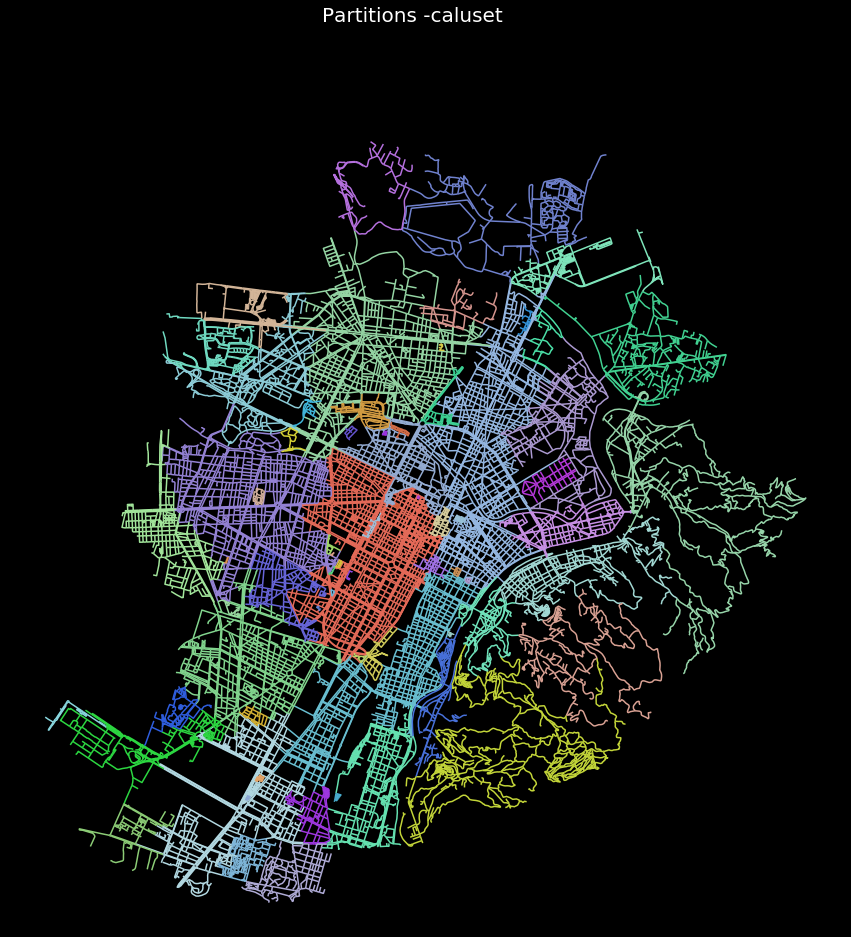

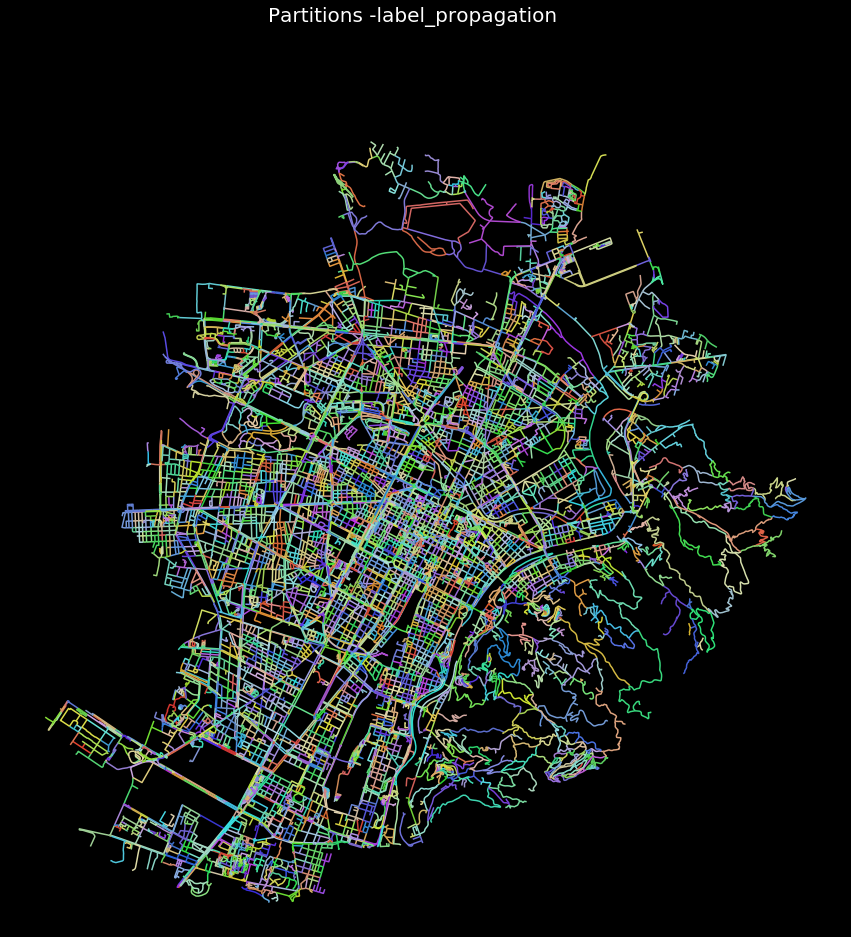

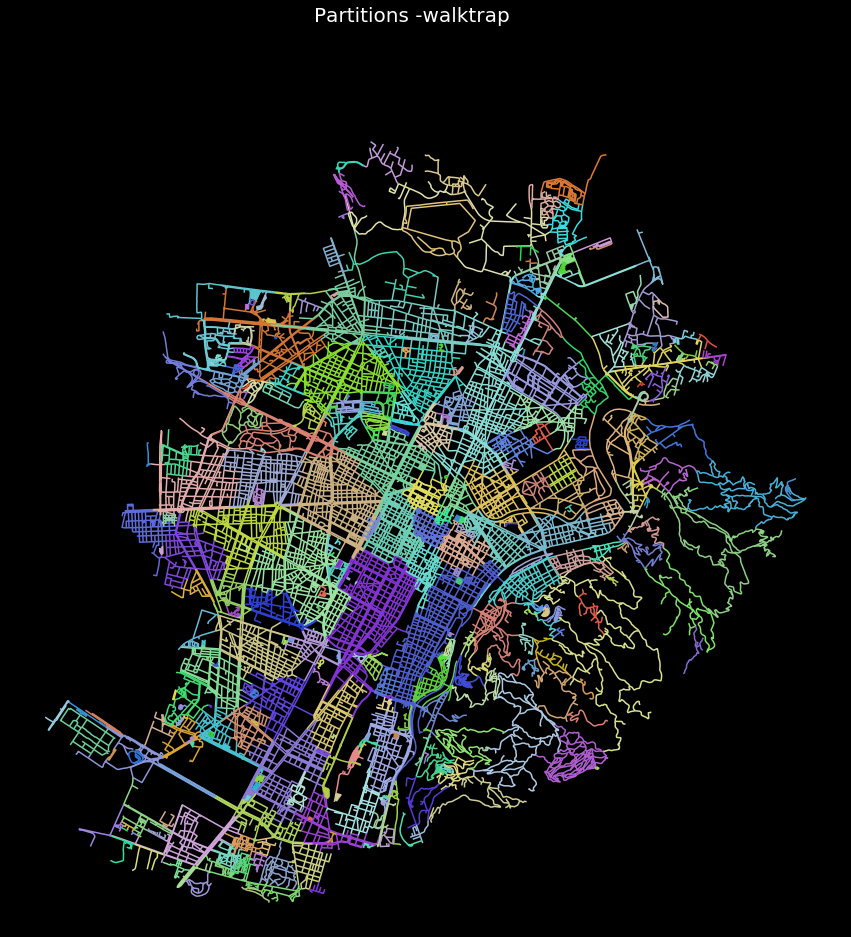

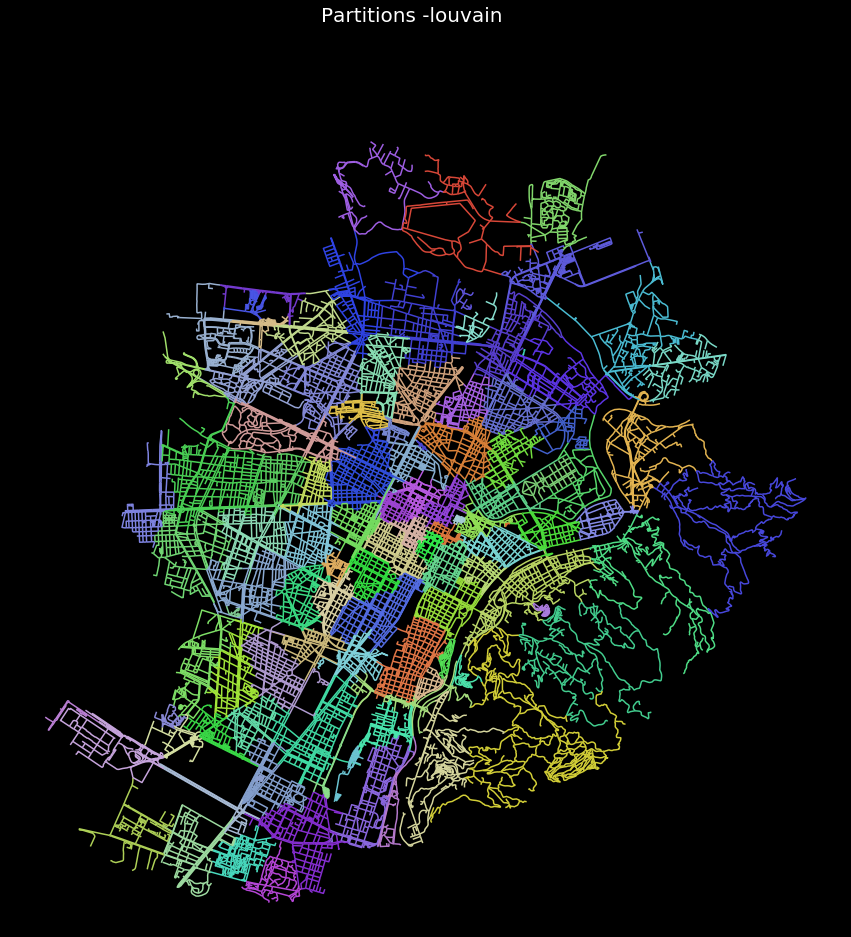

In [205]:
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts_fn[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    up.plot_lines(districts_fn, column = column, title = 'Partitions -'+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15)


### Comparison different methods vs louvain

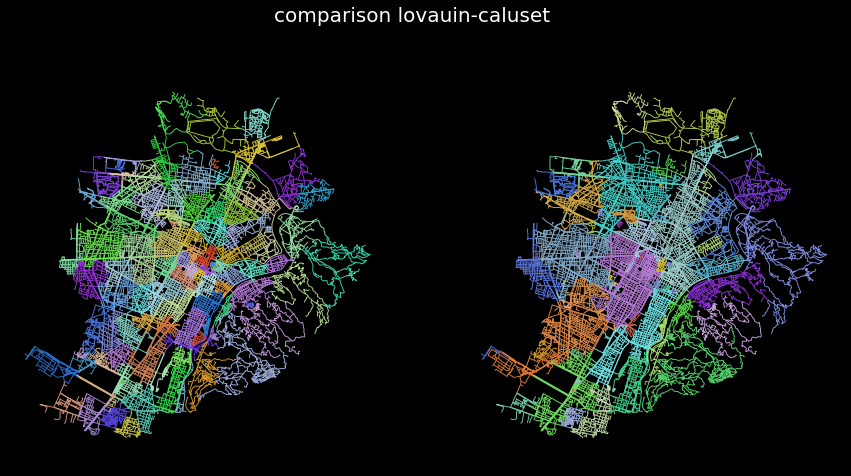

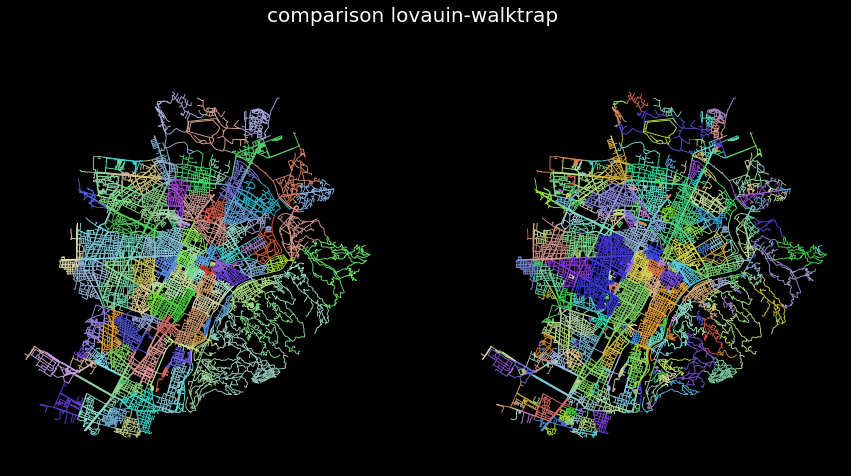

In [259]:
to_compare = ['caluset', 'walktrap']
for column in to_compare:
    up.cmap = rand_cmap(nlabels = 400, type_color='bright', first_color_black=False, last_color_black=False)
    up.plot_lines_aside(districts_fn, gdf_c = districts_fn, lw = 0.9, columnA = 'louvain' , columnB = column, 
                    title = 'comparison lovauin-'+column, scheme = None, cmap = cmap, black_background = True, 
                     fig_size = 15)

### Partitions as polygons

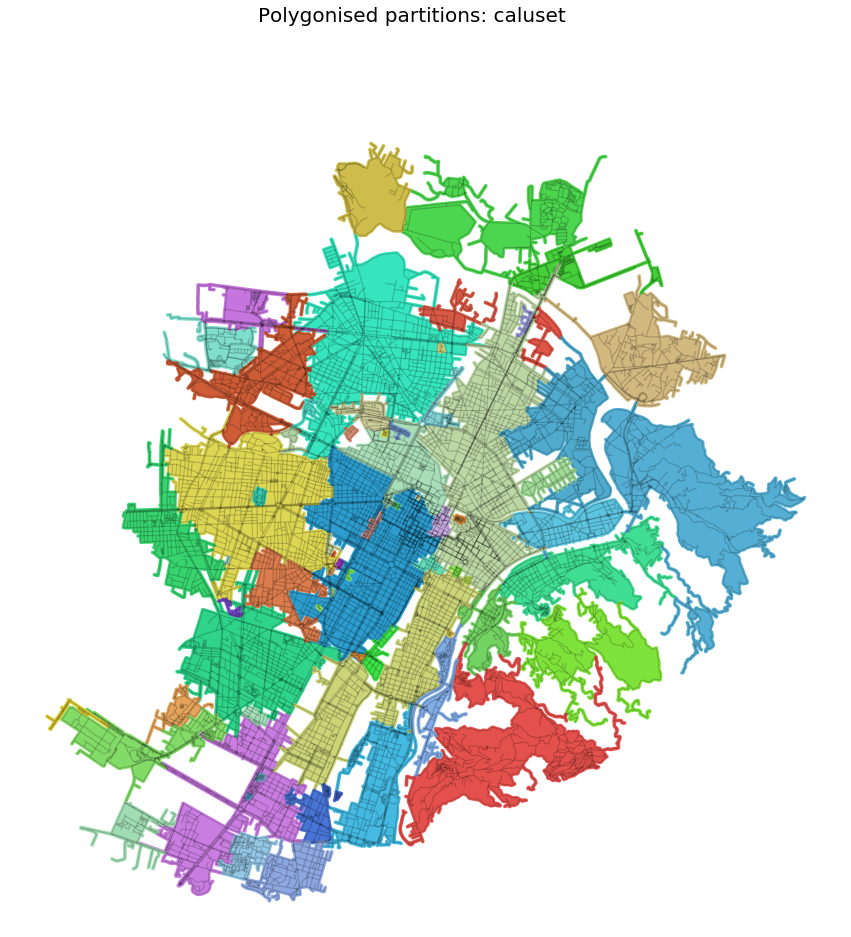

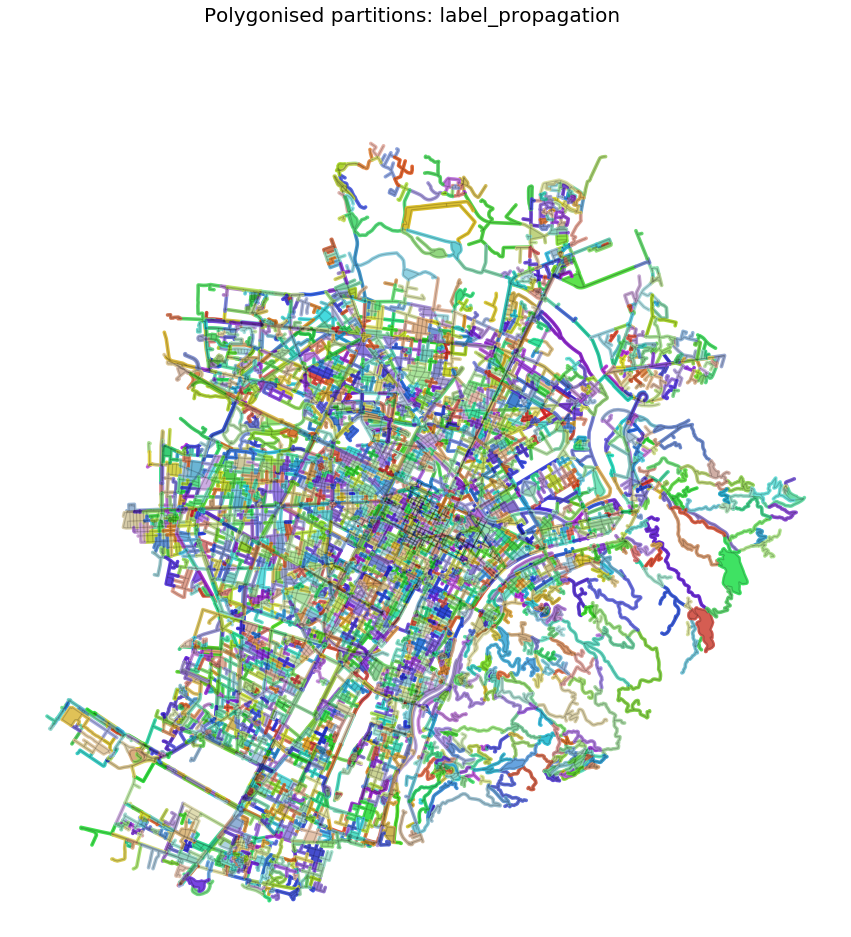

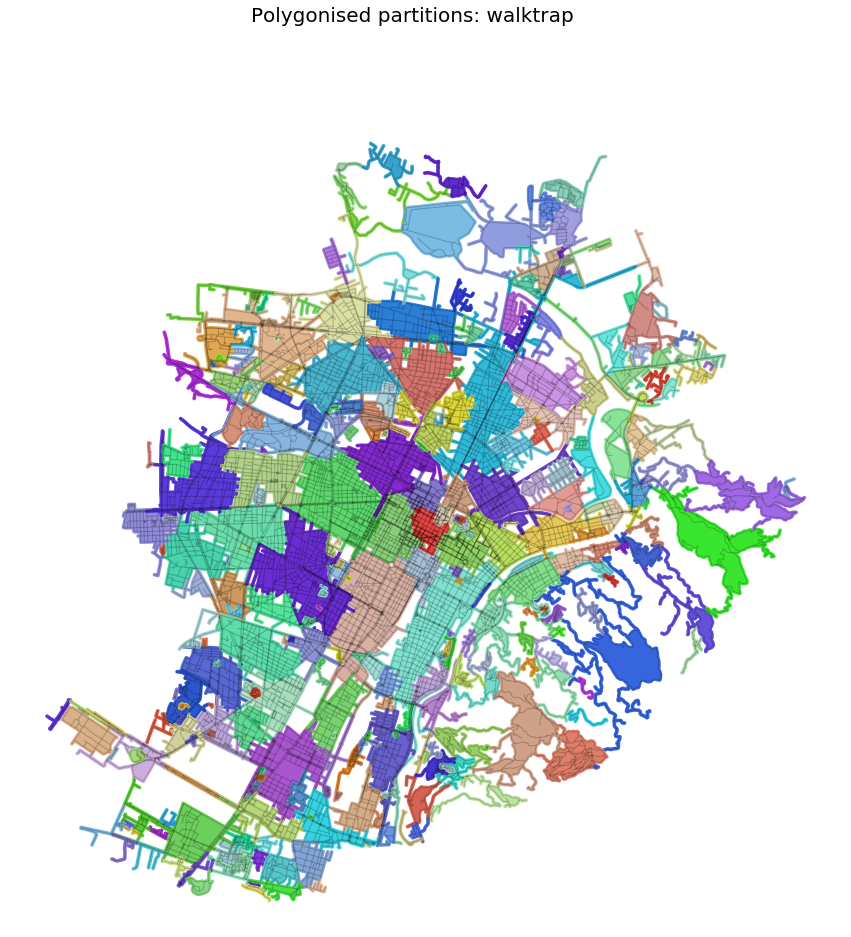

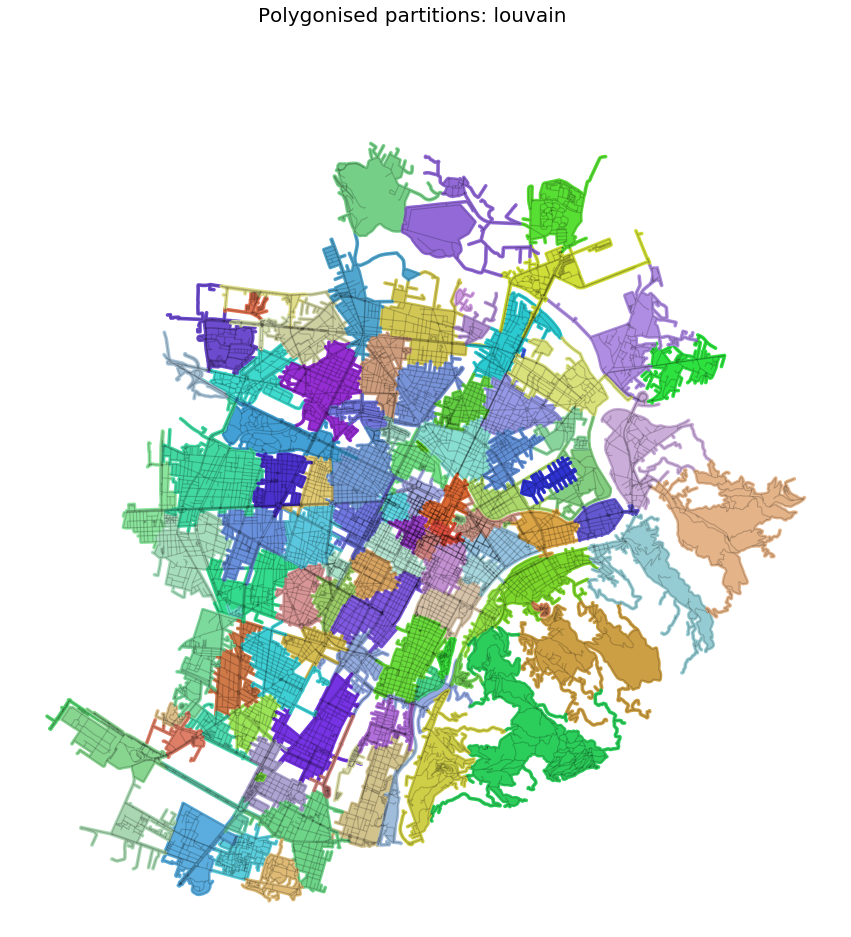

In [246]:
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts_fn[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    partitions = up.polygonise_partition(districts_fn, column, crs)
    up.plot_polygons(partitions, column = 'partitionID', cmap = cmap, title =  "Polygonised partitions: "+ column, 
                     black_background = False,  fig_size = 15, gdf_base_map = edges_graph)

## 2.2 District identification - Overlapping communities

In [ ]:
com = algorithms.lais2(dual_graph)

In [296]:
kclique = algorithms.kclique(dual_graphIG, k=3)

In [247]:
node_perception = algorithms.node_perception(dual_graph, threshold=0.55, overlap_threshold=0.25)

In [266]:
big_clam = algorithms.big_clam(dual_graphIG, dimensions=8, iterations=50, learning_rate=0.005)

## District identification full network - Louvain - different weights

In [16]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
weights = ['length', 'rad', None]

districts_louvain = edges_graph.copy()
for i in weights:
    districts_louvain = up.identify_regions(dual_graph, districts_louvain, weight = i, barrier_field = None)

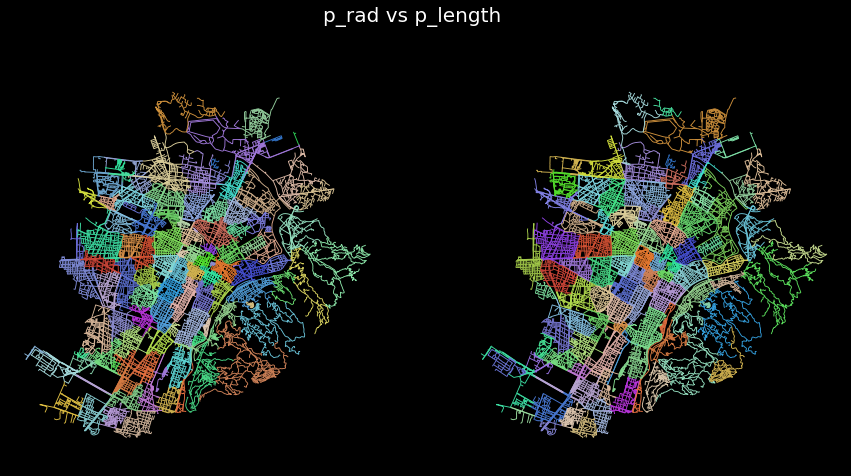

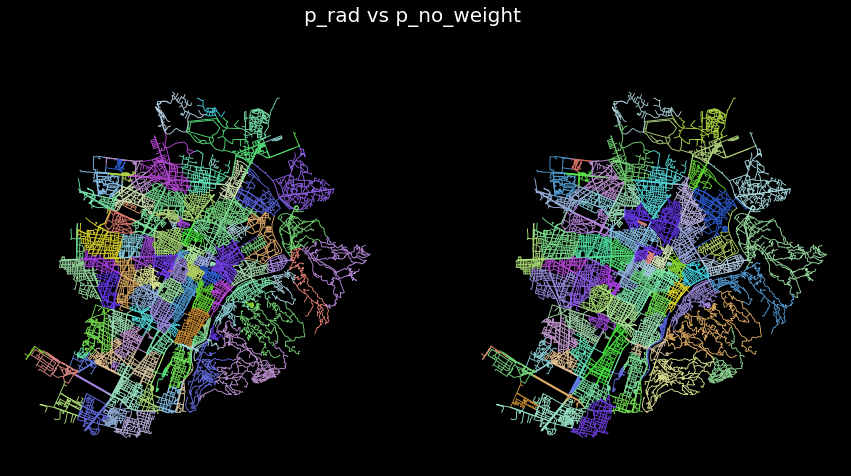

In [18]:
# visualising
to_compare = ['p_length', 'p_no_weight']
for column in to_compare:
    cmap = up.rand_cmap(nlabels = len(districts_louvain[column].unique()), type_color='bright', first_color_black=False, 
                 last_color_black=False)
    up.plot_lines_aside(districts_louvain, gdf_c = districts_louvain, lw = 0.9, columnA = 'p_rad' , columnB = column,
                     title = 'p_rad vs '+column, cmap = cmap, black_background = True, scheme = None, fig_size = 15)

## District identification full network - Louvain - with barrier removal

In [19]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
weights = ['length', 'rad', None]

districts_louvain_br = edges_graph.copy()
for i in weights:
    districts_louvain_br = up.identify_regions(dual_graph, districts_louvain_br, weight = i, barrier_field = 'sep_barr')

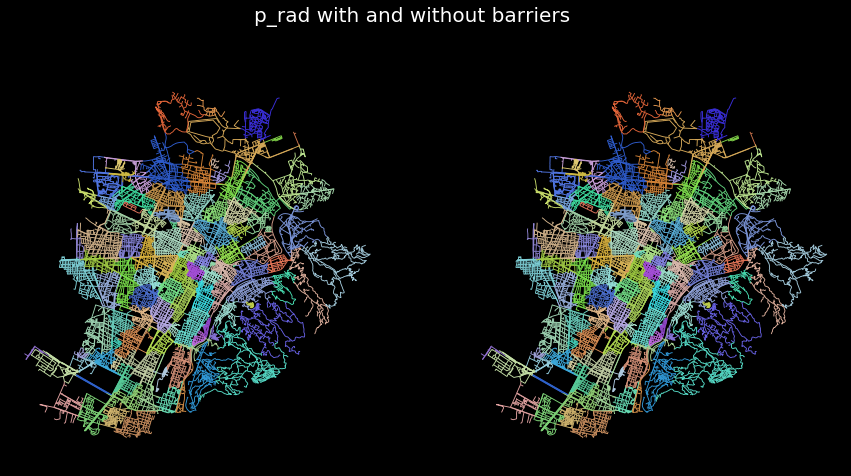

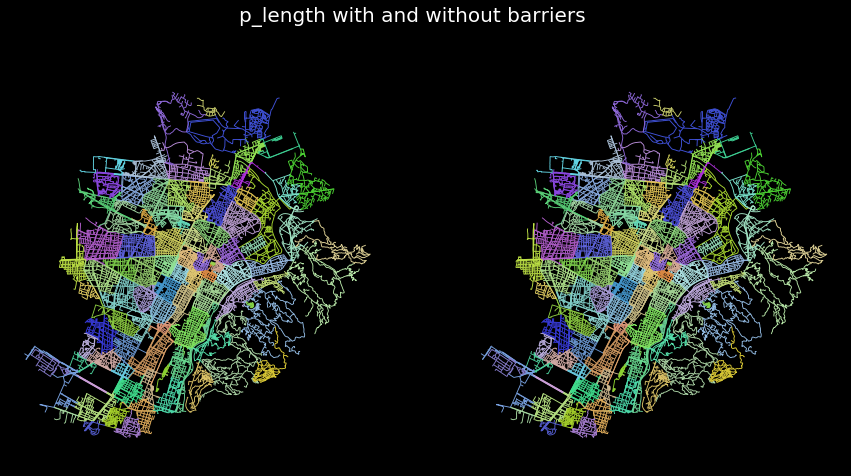

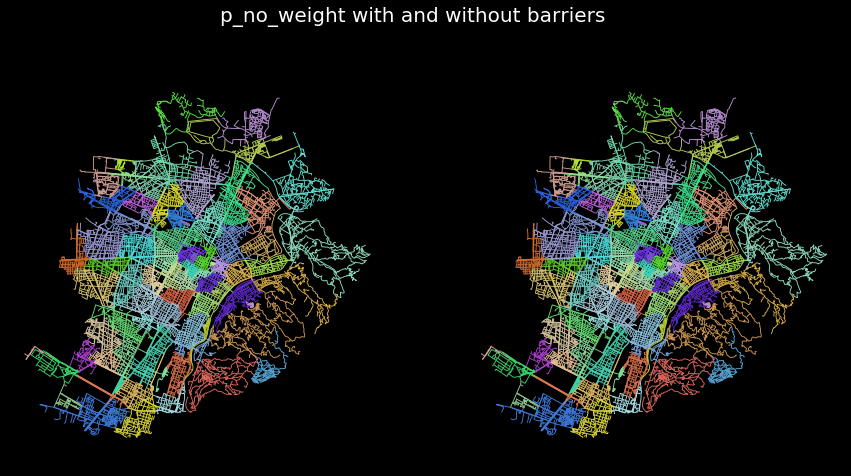

In [20]:
to_compare = ['p_rad','p_length', 'p_no_weight']
for column in to_compare:
    cmap = up.rand_cmap(nlabels = len(districts_louvain[column].unique()), type_color='bright', first_color_black=False, 
                 last_color_black=False)
    up.plot_lines_aside(districts_louvain, gdf_c = districts_louvain_br, lw = 0.9, columnA = column , columnB = column,
                     title = column+' with and without barriers', cmap = cmap, black_background = True, scheme = None, fig_size = 15)

In [28]:
# obtaining graph from the case-study area 
graph = up.graph_fromGDF(nodes_graph, edges_graph)

In [33]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
weights = ['length', None]

districts_louvain_primal = nodes_graph.copy()
for i in weights:
    districts_louvain_primal = identify_regions_primal(graph, districts_louvain_primal, weight = i, barrier_field = None)

In [ ]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
weights = ['length', None]

districts_louvain_primal_br = nodes_graph.copy()
for i in weights:
    districts_louvain_primal_br = identify_regions_primal(graph, districts_louvain_primal_br, weight = i, 
                                                          barrier_field = 'sep_barr')

In [161]:
columns = ['p_length', 'p_no_weight']
districts_louvain_primal_edges = edges_graph.copy()
districts_louvain_primal_edges_br = edges_graph.copy()

for i in columns:
    districts_louvain_primal_edges = assign_districts_to_edges_from_nodes(districts_louvain_primal_edges, districts_louvain_primal, 
                                                                         district_field = i)
    districts_louvain_primal_edges_br = assign_districts_to_edges_from_nodes(districts_louvain_primal_edges_br, districts_louvain_primal_br, 
                                                                         district_field = i)

31172 31175


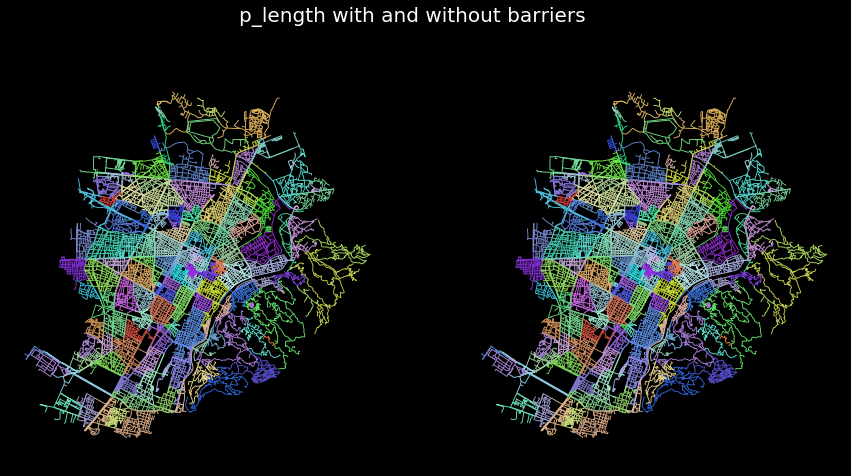

32147 32121


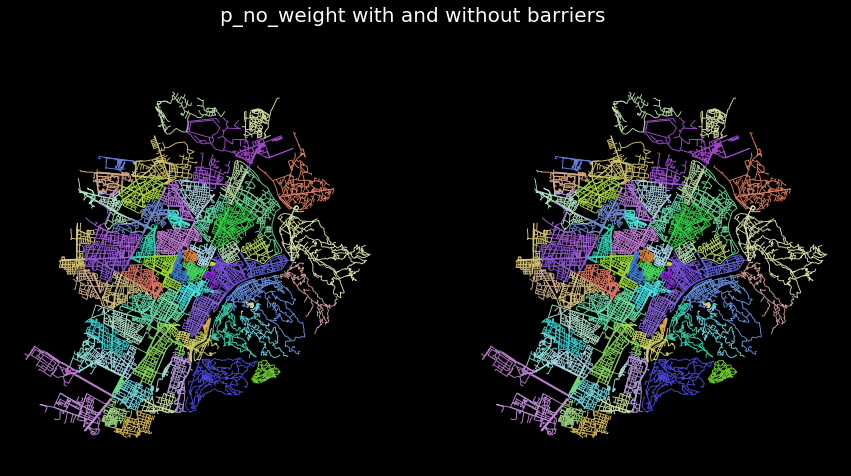

In [68]:
to_compare = ['p_length', 'p_no_weight']
for column in to_compare:
    cmap = up.rand_cmap(nlabels = len(districts_louvain_primal_edges[column].unique()), type_color='bright', first_color_black=False, 
                 last_color_black=False)
    tmp = districts_louvain_primal_edges[~districts_louvain_primal_edges[column].isnull()].copy()
    tmp_br = districts_louvain_primal_edges_br[~districts_louvain_primal_edges_br[column].isnull()].copy()
    tmp[column] = tmp[column].astype(int)
    tmp_br[column] = tmp_br[column].astype(int)
    up.plot_lines_aside(tmp, gdf_c = tmp_br, lw = 0.9, 
                        columnA = column , columnB = column, title = column+' with and without barriers', cmap = cmap, black_background = True, scheme = None, fig_size = 15)

In [164]:
districts_louvain_primal_edges_br

,edgeID,u,v,key,length,highway,oneway,lanes,name,pedestrian,geometry,p_barr,n_barr,c_barr,sep_barr,p_length,p_no_weight
0,0,0,11304,0,10.777,tertiary,0,Corso Siracusa,Corso Siracusa,0,"LINESTRING (392411.919 4987808.576, 392412.172...",[],[],[],False,0,0
1,1,0,11302,0,19.077,tertiary,0,Corso Siracusa,Corso Siracusa,0,"LINESTRING (392411.919 4987808.576, 392411.487...",[],[],[],False,0,0
2,2,0,1,0,42.023,footway,0,None,None,1,"LINESTRING (392411.919 4987808.576, 392407.991...",[],[],[],False,0,0
3,3,1,3421,0,110.596,tertiary,0,Corso Siracusa,Corso Siracusa,0,"LINESTRING (392370.842 4987800.379, 392374.480...",[],[],[],False,0,0
4,4,1,14983,0,6.947,tertiary,0,Corso Siracusa,Corso Siracusa,0,"LINESTRING (392370.842 4987800.379, 392370.563...",[],[],[],False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68290,68290,22032,22033,0,69.564,service,0,Via Giuseppe Grosso,Via Giuseppe Grosso,0,"LINESTRING (391568.341 4989415.595, 391573.066...",[],[],[],False,119,26
68294,68294,22033,22035,0,11.245,service,0,Via Giuseppe Grosso,Via Giuseppe Grosso,0,"LINESTRING (391573.066 4989484.998, 391561.857...",[],[],[22],True,None,None
68295,68295,22033,22036,0,13.125,service,0,Via Giuseppe Grosso,Via Giuseppe Grosso,0,"LINESTRING (391573.066 4989484.998, 391586.158...",[],[],[],False,119,26
68310,68310,22038,22043,0,107.687,footway,0,None,None,1,"LINESTRING (394102.365 4990271.577, 394152.495...",[],[],[],False,13,11


In [ ]:
tmp = districts_louvain_primal_edges_br.copy()
tmp = tmp[['u','v']][tmp.sep_barr == True]

tmp = pd.merge(tmp, districts_louvain_primal_br[['p_length', 'nodeID']], how = 'left', left_on= "u", right_on = "nodeID")
tmp = tmp.rename(columns = {'p_length':'partition_u'})
tmp = pd.merge(tmp, districts_louvain_primal_br[['p_length', 'nodeID']], how = 'left', left_on= "v", right_on = "nodeID")
tmp = tmp.rename(columns = {'p_length':'partition_v'})
tmp[tmp.partition_u == tmp.partition_v]

In [36]:
# geographical readjustment

def assign_districts_to_edges_from_nodes(edges_gdf, nodes_gdf, district_field):
    ix_u = edges_gdf.columns.get_loc("u")+1  
    ix_v = edges_gdf.columns.get_loc("v")+1  
    
    edges_gdf = edges_gdf.copy()
    edges_gdf[district_field] = None
    
    for row in edges_gdf.itertuples():
        district_u = nodes_gdf.loc[row[ix_u]][district_field]
        district_v = nodes_gdf.loc[row[ix_v]][district_field]
        if district_u == district_v: edges_gdf.at[row.Index, district_field] = district_u

    return edges_gdf
    

In [153]:
def identify_regions_primal(graph, nodes_graph, weight = None, barrier_field = None):
    """
    Run the natural_roads function on an entire geodataframe of street segments.
    The geodataframes are supposed to be cleaned and can be obtained via the functions "get_fromOSM(place)" or "get_fromSHP(directory, 
    epsg)". The parameter tolerance indicates the maximux deflection allowed to consider two roads possible natural continuation.
    
    Parameters
    ----------
    dual_graph: GeoDataFrames
    weight = string
    
    Returns
    -------
    GeoDataFrames
    """

    subdvisions = []
    if weight == None: weight = "no_weight" #the function requires a string 
    # extraction of the best partitions
    partition = best_partition(graph, weight=weight, barrier_field = barrier_field)
    districts = nodes_graph.copy()
    districts["p_"+weight] = districts.nodeID.map(partition)
    return districts

In [171]:
import networkx as nx, numpy as np
import functools
import community
import array
import numbers
import warnings

__PASS_MAX = -1
__MIN = 0.0000001

def check_random_state(seed):
    """Turn seed into a np.random.RandomState instance.

    Parameters
    ----------
    seed : None | int | instance of RandomState
        If seed is None, return the RandomState singleton used by np.random.
        If seed is an int, return a new RandomState instance seeded with seed.
        If seed is already a RandomState instance, return it.
        Otherwise raise ValueError.

    """
    if seed is None or seed is np.random: return np.random.mtrand._rand
    if isinstance(seed, (numbers.Integral, np.integer)): return np.random.RandomState(seed)
    if isinstance(seed, np.random.RandomState): return seed
    raise ValueError("%r cannot be used to seed a numpy.random.RandomState"
                     " instance" % seed)

def partition_at_level(dendrogram, level):
    """Return the partition of the nodes at the given level

    A dendrogram is a tree and each level is a partition of the graph nodes.
    Level 0 is the first partition, which contains the smallest communities,
    and the best is len(dendrogram) - 1.
    The higher the level is, the bigger are the communities

    Parameters
    ----------
    dendrogram : list of dict
       a list of partitions, ie dictionnaries where keys of the i+1 are the
       values of the i.
    level : int
       the level which belongs to [0..len(dendrogram)-1]

    Returns
    -------
    partition : dictionnary
       A dictionary where keys are the nodes and the values are the set it
       belongs to

    Raises
    ------
    KeyError
       If the dendrogram is not well formed or the level is too high

    See Also
    --------
    best_partition which directly combines partition_at_level and
    generate_dendrogram to obtain the partition of highest modularity   
    """
    partition = dendrogram[0].copy()
    for index in range(1, level + 1):
        for node, community in partition.items():  partition[node] = dendrogram[index][community]
    return partition


def modularity(partition, graph, weight='weight'):
    """Compute the modularity of a partition of a graph

    Parameters
    ----------
    partition : dict
       the partition of the nodes, i.e a dictionary where keys are their nodes
       and values the communities
    graph : networkx.Graph
       the networkx graph which is decomposed
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'


    Returns
    -------
    modularity : float
       The modularity

    Raises
    ------
    KeyError
       If the partition is not a partition of all graph nodes
    ValueError
        If the graph has no link
    TypeError
        If graph is not a networkx.Graph

    References
    ----------
    .. 1. Newman, M.E.J. & Girvan, M. Finding and evaluating community
    structure in networks. Physical Review E 69, 26113(2004).

    """
    if graph.is_directed(): raise TypeError("Bad graph type, use only non directed graph")

    within_degree = dict([])
    exp_degree = dict([])
    nr_links = graph.size(weight=weight)
    if nr_links == 0: raise ValueError("A graph without link has an undefined modularity")

    for node in graph:
        community = partition[node]
        exp_degree[community] = exp_degree.get(community, 0.) + graph.degree(node, weight=weight)
        for neighbor, attributes in graph[node].items():
            edge_weight = attributes.get(weight, 1)
            if partition[neighbor] == community:
                if neighbor == node: within[community] = within.get(community, 0.) + float(edge_weight)
                else: within[community] = within.get(community, 0.) + float(edge_weight) / 2.

    res = 0.
    for community in set(partition.values()):
        # Ai is the actual number of edges falling between a particular pair of vertices i and j is 
        A = within_degree.get(community, 0.) / nr_links
        # P_ij number of edges between i and j
        P = (exp_degree.get(community, 0.) / (2. * nr_links))** 2
        res += A-P 

    return res
    
def best_partition(graph, partition=None,  weight='weight', resolution=1., randomize=None, random_state = None, 
            barrier_field = None):
                   
    """Compute the partition of the graph nodes which maximises the modularity
    (or try..) using the Louvain heuristices

    This is the partition of highest modularity, i.e. the highest partition
    of the dendrogram generated by the Louvain algorithm.

    Parameters
    ----------
    graph : networkx.Graph
       the networkx graph which is decomposed
    partition : dict, optional
       the algorithm will start using this partition of the nodes.
       It's a dictionary where keys are their nodes and values the communities
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    resolution :  double, optional
        Will change the size of the communities, default to 1.
        represents the time described in
        "Laplacian Dynamics and Multiscale Modular Structure in Networks",
        R. Lambiotte, J.-C. Delvenne, M. Barahona
    randomize : boolean, optional
        Will randomize the node evaluation order and the community evaluation
        order to get different partitions at each call
    random_state : int, RandomState instance or None, optional (default=None)
        If int, random_state is the seed used by the random number generator;
        If RandomState instance, random_state is the random number generator;
        If None, the random number generator is the RandomState instance used
        by `np.random`.

    Returns
    -------
    partition : dictionnary
       The partition, with communities numbered from 0 to number of communities

    Raises
    ------
    NetworkXError
       If the graph is not Eulerian.

    See Also
    --------
    generate_dendrogram to obtain all the decompositions levels

    Notes
    -----
    Uses Louvain algorithm

    References
    ----------
    .. 1. Blondel, V.D. et al. Fast unfolding of communities in
    large networks. J. Stat. Mech 10008, 1-12(2008).

    """
    dendo = generate_dendrogram(graph, partition, weight, resolution, randomize, random_state, barrier_field)
    return partition_at_level(dendo, len(dendo) - 1)


def generate_dendrogram(graph, initial_partition = None, weight='weight', resolution=1., randomize=None, random_state=None, 
        barrier_field = None):
    
    """Find communities in the graph and return the associated dendrogram

    A dendrogram is a tree and each level is a partition of the graph nodes.
    Level 0 is the first partition, which contains the smallest communities,
    and the best is len(dendrogram) - 1. The higher the level is, the bigger
    are the communities

    Parameters
    ----------
    graph : networkx.Graph
        the networkx graph which will be decomposed
    initial_partition : dict, optional
        the algorithm will start using this partition of the nodes. It's a
        dictionary where keys are their nodes and values the communities
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    resolution :  double, optional
        Will change the size of the communities, default to 1.
        represents the time described in
        "Laplacian Dynamics and Multiscale Modular Structure in Networks",
        R. Lambiotte, J.-C. Delvenne, M. Barahona

    Returns
    -------
    dendrogram : list of dictionaries
        a list of partitions, ie dictionnaries where keys of the i+1 are the
        values of the i. and where keys of the first are the nodes of graph

    Raises
    ------
    TypeError
        If the graph is not a networkx.Graph

    See Also
    --------
    best_partition

    Notes
    -----
    Uses Louvain algorithm

    References
    ----------
    .. 1. Blondel, V.D. et al. Fast unfolding of communities in large
    networks. J. Stat. Mech 10008, 1-12(2008).

    """
    if graph.is_directed(): raise TypeError("Bad graph type, use only non directed graph")

    # Properly handle random state, eventually remove old `randomize` parameter
    # NOTE: when `randomize` is removed, delete code up to random_state = ...
    if randomize is not None:
        # If shouldn't randomize, we set a fixed seed to get determinisitc results
        if randomize is False: random_state = 0

    # We don't know what to do if both `randomize` and `random_state` are defined
    if randomize and random_state is not None:
        raise ValueError("`randomize` and `random_state` cannot be used at the same time")
    
    random_state = check_random_state(random_state)

    # special case, when there is no link
    # the best partition is everyone in its community
    if graph.number_of_edges() == 0:
        partitions = dict([])
        for i, node in enumerate(graph.nodes()): partitions[node] = i
        return [partitions]

    initial_graph = graph.copy()
    status = Status()
    status.initial_status(initial_graph, weight, initial_partition) #initial status
    status_list = list()
    _one_level(initial_graph, status, weight, resolution, random_state, barrier_field = barrier_field) 
    new_modularity = _modularity(status, resolution)
    subdivision = _renumber(status.nodes_to_communities)
    status_list.append(subdivision)
    
    current_modularity = new_modularity
    current_graph = induced_graph(subdivision, initial_graph, weight, barrier_field = barrier_field) # graph where communities are nodes
    status.initial_status(current_graph, weight)
    i = 0
    while True:
        if i == 0:  print("first loop -------------------------------------")
        else: print("iiiiiiiiiiiiii ------------------------------------------------------------ ", i)
        _one_level(current_graph, status, weight, resolution, random_state, barrier_field = barrier_field)
        new_modularity = _modularity(status, resolution)
        if new_modularity - current_modularity < __MIN: break
        subdivision = _renumber(status.nodes_to_communities)
        status_list.append(subdivision)
        current_modularity = new_modularity
        current_graph = induced_graph(subdivision, current_graph, weight, barrier_field = barrier_field)
        status.initial_status(current_graph, weight)
        i +=1
    
    return status_list[:]


def induced_graph(subdivision, graph, weight= "weight", barrier_field = None):
    """Produce the graph where nodes are the communities

    there is a link of weight w between communities if the sum of the weights
    of the links between their elements is w

    Parameters
    ----------
    partition : dict
       a dictionary where keys are graph nodes and values the partitions the node belongs to
    graph : networkx.Graph
        the initial graph
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'

    Returns
    -------
    g : networkx.Graph
       a networkx graph where nodes are the parts

    """
    ret = nx.Graph()
    ret.add_nodes_from(subdivision.values())

    for node, other_node, data in graph.edges(data=True):
        edge_weight = data.get(weight, 1)
        community = subdivision[node]
        other_community = subdivision[other_node]
        barrier = False
        if barrier_field != None: barrier = data.get(barrier_field)
        if barrier == True: continue
        original_weight = ret.get_edge_data(community, other_community, {weight: 0}).get(weight, 1)
        ret.add_edge(community, other_community, **{weight: original_weight + edge_weight})

    return ret


def _renumber(dictionary):
    """Renumber the values of the dictionary from 0 to n
    """
    count = 0
    ret = dictionary.copy()
    new_values = dict([])

    for key in dictionary.keys():
        value = dictionary[key]
        new_value = new_values.get(value, -1)
        if new_value == -1:
            new_values[value] = count
            new_value = count
            count += 1
        ret[key] = new_value

    return ret


def _one_level(graph, status, weight_key, resolution, random_state, barrier_field):
    
    """Compute one level of communities  """
    
    modified = True
    nb_pass_done = 0
    current_modularity = _modularity(status, resolution)
    new_modularity = current_modularity

    while modified and nb_pass_done != __PASS_MAX:
        current_modularity = new_modularity
        modified = False
        nb_pass_done += 1
         
        for node in random_state.permutation(list(graph.nodes())):
            community = status.nodes_to_communities[node]
            degc_totw = status.gdegrees.get(node, 0.) / (status.total_weight * 2.)  # NOQA
            neighboring_communities = _neighboring_communities(node, graph, status, weight_key, barrier_field)
            remove_cost = - resolution * neighboring_communities.get(community,0) + (status.degrees.get(community, 0.) -
                            status.gdegrees.get(node, 0.)) * degc_totw
            _remove(node, community, neighboring_communities.get(community, 0.), status)
            best_community = community
            best_increase = 0
            
            for com, dnc in random_state.permutation(list(neighboring_communities.items())):
                increase = remove_cost + resolution * dnc - status.degrees.get(com, 0.) * degc_totw
                if increase > best_increase:
                    best_increase = increase
                    best_community = com
            print(neighboring_communities)        
            print(node, " best community ", best_community)
            print(neighboring_communities.get(best_community, 0.))
            _insert(node, best_community, neighboring_communities.get(best_community, 0.), status)
            if best_community != community: modified = True
                
        new_modularity = _modularity(status, resolution)
        if new_modularity - current_modularity < __MIN:break

def _neighboring_communities(node, graph, status, weight_key, barrier_field = None):
    """
    Compute the communities in the neighborhood of node in the graph given
    with the decomposition nodes_to_communities
    """
    weights = {}
    for neighbor, data in graph[node].items():
        if neighbor != node:
            edge_weight = data.get(weight_key, 1)
            barrier = False
            if barrier_field != None: barrier = data.get(barrier_field)
                
            if barrier == True: 
                print(node, ' cannot join', neighbor)
                continue
            neighboring_communities = status.nodes_to_communities[neighbor]
            weights[neighboring_communities] = weights.get(neighboring_communities, 0) + edge_weight

    return weights


def _remove(node, community, weight, status):
    """ Remove node from community and modify status"""
    status.degrees[community] = (status.degrees.get(community, 0.)- status.gdegrees.get(node, 0.))
    status.internals[community] = float(status.internals.get(community, 0.) -  weight - status.loops.get(node, 0.))
    status.nodes_to_communities[node] = -1

def _insert(node, community, weight, status):
    """ Insert node into community and modify status"""
    status.nodes_to_communities[node] = community
    status.degrees[community] = (status.degrees.get(community, 0.) + status.gdegrees.get(node, 0.))
    status.internals[community] = float(status.internals.get(community, 0.) +  weight + status.loops.get(node, 0.))

def _modularity(status, resolution):
    """
    Fast compute the modularity of the partition of the graph using
    status precomputed
    """
    links = float(status.total_weight)
    result = 0.
    for community in set(status.nodes_to_communities.values()):
        in_degree = status.internals.get(community, 0.)
        degree = status.degrees.get(community, 0.)
        if links > 0: result += in_degree * resolution / links -  ((degree / (2. * links)) ** 2)
    return result
 

class Status(object):
    """
    To handle several data in one struct.
    Could be replaced by named tuple, but don't want to depend on python 2.6
    """
    nodes_to_communities = {}
    total_weight = 0
    internals = {}
    degrees = {}
    gdegrees = {}

    def __init__(self):
        self.nodes_to_communities = dict([])
        self.total_weight = 0
        self.degrees = dict([])
        self.gdegrees = dict([])
        self.internals = dict([])
        self.loops = dict([])

    def __str__(self):
        return ("nodes_to_communities : " + str(self.nodes_to_communities) + " degrees : "
                + str(self.degrees) + " internals : " + str(self.internals)
                + " total_weight : " + str(self.total_weight))

    def copy(self):
        """Perform a deep copy of status"""
        new_status = Status()
        new_status.nodes_to_communities = self.nodes_to_communities.copy()
        new_status.internals = self.internals.copy()
        new_status.degrees = self.degrees.copy()
        new_status.gdegrees = self.gdegrees.copy()
        new_status.total_weight = self.total_weight

    def initial_status(self, graph, weight, part=None):
        """Initialize the status of a graph with every node in one community"""
        count = 0
        self.nodes_to_communities = dict([])
        self.total_weight = 0
        self.degrees = dict([])
        self.gdegrees = dict([])
        self.internals = dict([])
        self.total_weight = graph.size(weight=weight)
        
        if part is None:
            for node in graph.nodes():
                self.nodes_to_communities[node] = count
                deg = float(graph.degree(node, weight=weight))
                if deg < 0:
                    error = "Bad node degree ({})".format(deg)
                    raise ValueError(error)
                self.degrees[count] = deg
                self.gdegrees[node] = deg
                edge_data = graph.get_edge_data(node, node, default={weight: 0})
                self.loops[node] = float(edge_data.get(weight, 1))
                self.internals[count] = self.loops[node]
                count += 1
        else:
            for node in graph.nodes():
                community = part[node]
                self.nodes_to_communities[node] = community
                deg = float(graph.degree(node, weight=weight))
                self.degrees[community] = self.degrees.get(community, 0) + deg
                self.gdegrees[node] = deg
                inc = 0.
                for neighbor, data in graph[node].items():
                    edge_weight = data.get(weight, 1)
                    if edge_weight <= 0:
                        error = "Bad graph type ({})".format(type(graph))
                        raise ValueError(error)
                    if part[neighbor] == community:
                        if neighbor == node: inc += float(edge_weight)
                        else: inc += float(edge_weight) / 2.
                
                self.internals[community] = self.internals.get(community, 0) + inc

## Districts identification based on POI

In [72]:
amenities = ['arts_centre', 'atm', 'bank', 'bar', 'bbq', 'bicycle_rental', 'biergarten', 
             'boat_rental', 'boat_sharing', 'brothel', 'bureau_de_change', 'cafe', 'car_rental', 'car_sharing', 'car_wash',
             'casino', 'childcare', 'cinema', 'clinic', 'college', 'community_centre', 'courthouse', 'crematorium', 'dentist',
             'dive_centre', 'doctors', 'driving_school', 'embassy', 'fast_food', 'ferry_terminal', 'fire_station', 'food_court',
             'fuel', 'gambling', 'gym', 'hospital', 'ice_cream', 'internet_cafe', 'kindergarten', 'kitchen', 
             'language_school', 'library', 'marketplace', 'monastery', 'motorcycle_parking', 'music_school', 'nightclub', 
             'nursing_home', 'pharmacy', 'place_of_worship', 'planetarium', 'police', 'post_office', 'prison', 'pub',
             'public_building', 'ranger_station', 'restaurant', 'sauna',  'school', 'social_centre', 'social_facility',
             'stripclub', 'studio', 'swingerclub', 'theatre', 'toilets', 'townhall', 'university', 'veterinary']

In [116]:
adult_entertainment = ['brothel','casino', 'swingerclub', 'stripclub', 'nightclub', 'gambling'] 
food_bars = ['bbq', 'restaurant', 'fast_food', 'kitchen', 'food_court', 'cafe;restaurant', 'bar', 'biergarten', 'cafe', 'pub']
shops = ['car_wash', 'pharmacy', 'internet_cafe', 'ice_cream', 'driving_school', 'marketplace']
service = ['atm bank,  bureau_de_change', 'car_sharing', 'crematorium', 'toilets', 'sauna', 'post_office', 'motorcycle_parking', 'post_office;atm'
            'fuel', 'gym']
tourism = ['planetarium', 'boat_rental', 'boat_sharing', 'bicycle_rental', 'car_rental', 'dive_centre']
business = ['coworking_space', 'conference_centre']
culture = ['arts_centre', 'cinema','theatre', 'studio', 'music_school', 'exhibition_centre', 'museum']
social = ['social_facility', 'social_centre', 'community_centre', 'cultural_centre']
education = ['college', 'university school', 'language_school', 'research_institute']
public = ['courthouse', 'townhall', 'public_building', 'prison','embassy', 'library' ]
religion = ['place_of_worship', 'monastery']
health_care = ['childcare', 'clinic', 'dentist', 'veterinary', 'nursing_home', 'kindergarten', 'hospital', 'doctors']
emergency = ['resque_station', 'ranger_station', 'police', 'fire_station']

In [119]:
amenities = [adult_entertainment, food_bars, shops, service, tourism, business, culture, social, education,
             public, religion, health_care, emergency]
names = ['adult_entertainment', 'food_bars', 'shops', 'service', 'tourism', 'business', 'culture', 'social', 'education', 
         'public', 'religion', 'health_care', 'emergency']
to_keep = list(set(x for l in amenities for x in l))

In [113]:
services = ox.pois.pois_from_place(place, amenities = to_keep).to_crs(epsg=epsg)
services.reset_index(inplace = True, drop = True)
services = services[['geometry', 'amenity']]
for index, row in services.iterrows(): 
    if row['geometry'].geom_type != 'Point':
            services.at[index,'geometry'] = row['geometry'].centroid
    
services["x"], services["y"] = list(zip(*[(r.coords[0][0], r.coords[0][1]) for r in services.geometry]))

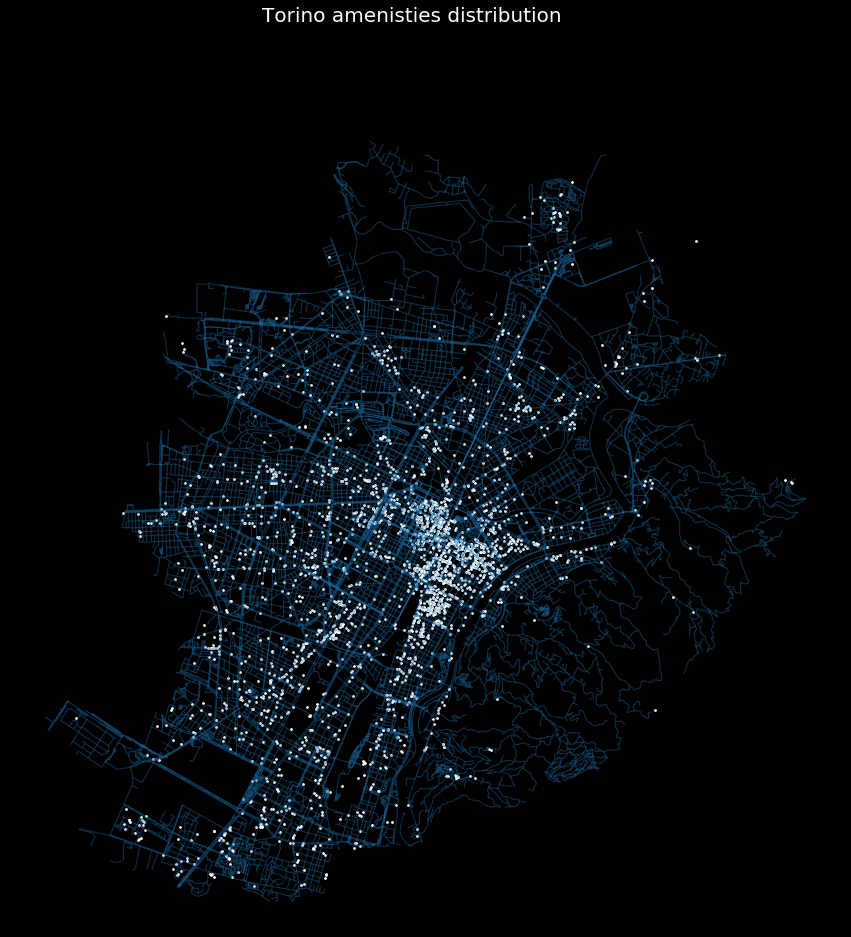

In [114]:
up.plot_points(services, gdf_base_map = edges_graph, ms = 3, title = city_name+' amenisties distribution')

In [120]:
nodes_graph_POI = nodes_graph.copy()
for n,i in enumerate(amenities):
    nodes_graph_POI = weight_nodes(nodes_graph_POI, services, i, names[n])

In [101]:
def weight_nodes(nodes_gdf, service_points_gdf, list_amenities, field, radius = 50):
    """
    Given a nodes- and a services/points-geodataframes, the function assigns an attribute to nodes in the graph G (prevously derived from 
    nodes_gdf) based indeed on the amount of features in the services_gdf in a buffer around each node. 
    
    Parameters
    ----------
    nodes_gdf: Point GeoDataFrame
    service_points_gdf: Point GeoDataFrame
    G: networkx multigraph
    name: string, attribute name
    radius: float, distance around the node within looking for point features (services)
    
    Returns
    -------
    networkx multidigraph
    """
    nodes_gdf[field] = None
    tmp = service_points_gdf[service_points_gdf['amenity']].copy()
    sindex = tmp.sindex
    
    nodes_gdf[field] = nodes_gdf.apply(lambda row: _count_services_around_node(row["geometry"], tmp, sindex, radius = radius), axis=1)
    
    return nodes_gdf

def _count_services_around_node(node_geometry, service_points_gdf, service_points_gdf_sindex, radius):
    """
    The functions supports the weight_nodes function.
    
    Parameters
    ----------
    node_geometry: Point geometry
    service_points_gdf: Point GeoDataFrame
    service_points_gdf_sindex = Rtree Spatial Index
    radius: float, distance around the node within looking for point features (services)
    
    Returns
    -------
    Integer value
    """

    buffer = node_geometry.buffer(radius)
    possible_matches_index = list(service_points_gdf_sindex.intersection(buffer.bounds))
    possible_matches = service_points_gdf.iloc[possible_matches_index]
    precise_matches = possible_matches[possible_matches.intersects(buffer)]
    weight = len(precise_matches)
        
    return weight

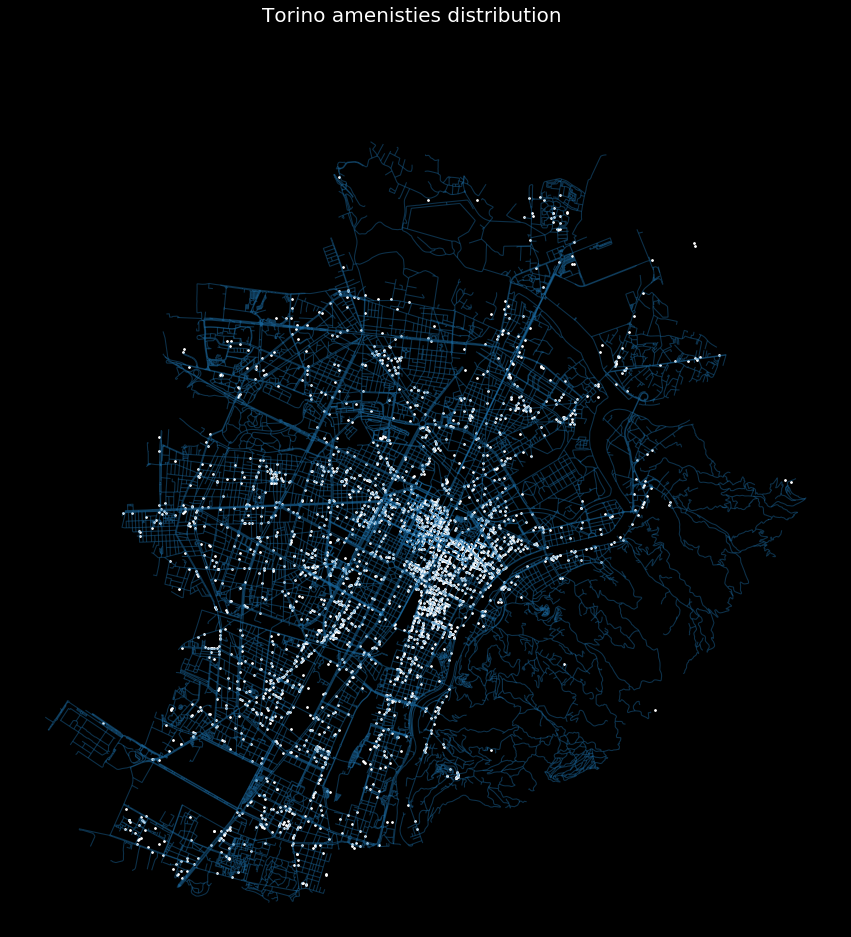

In [123]:
DB = DBSCAN(eps = 100, min_samples = 10).fit(nodes_graph_POI.drop('geometry', axis = 1))
nodes_graph_POI['cluster']= DB.labels_
print(set(list(DB.labels_)))

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, -1}


In [129]:
eps = [2,3,5,10,20,30,40,50]
sample = [20,25,30,35,40,45,50,60]
for e in eps:
    for s in sample:
        DB = DBSCAN(eps = e, min_samples = s).fit(nodes_graph_POI.drop('geometry', axis = 1))
        nodes_graph_POI['cluster']= DB.labels_
        if len(set(list(DB.labels_))) < 3: continue
        cmap = up.rand_cmap(nlabels = len(nodes_graph_POI['cluster'].unique()), type_color='bright', first_color_black=False, 
                         last_color_black=False)
        up.plot_points(nodes_graph_POI[nodes_graph_POI.cluster != -1], gdf_base_map = edges_graph, ms = 4, 
                       title = city_name+' clusters eps: '+str(e)+' min_samples: '+str(s), 
                       column = 'cluster', cmap = cmap, legend = True, base_map_alpha = 0.2,)

In [75]:
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler

DB = DBSCAN(eps = 100, min_samples = 10).fit(services[['x', 'y']])
services['cluster']= DB.labels_
print(set(list(DB.labels_)))

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, -1}


In [ ]:
eps = [90,100,120,150,170,200,230,300]
sample = [10,15,20, 25,30,35,40,45,50]
for e in eps:
    for s in sample:
        DB = DBSCAN(eps = e, min_samples = s).fit(services[['x', 'y']])
        services['cluster']= DB.labels_
        if len(set(list(DB.labels_))) < 3: continue
        cmap = up.rand_cmap(nlabels = len(services['cluster'].unique()), type_color='bright', first_color_black=False, 
                         last_color_black=False)
        up.plot_points(services[services.cluster != -1], gdf_base_map = edges_graph, ms = 4, 
                       title = city_name+' clusters eps: '+str(e)+' min_samples: '+str(s), 
                       column = 'cluster', cmap = cmap, legend = True, base_map_alpha = 0.2,)

## District identification with network broken by negative barriers

## Assign edges and nodes to a partition

In [81]:
nodes_graph['district'] = 0
sindex = edges_graph.sindex # spatial index

edges_graph['district'] = edges_graph['p_length'] 
nodes_graph['district'] = nodes_graph.apply(lambda row: up.assign_district_to_nodes(row['geometry'], sindex, edges_graph), 
                                            axis = 1)
nodes_graph['district'] = nodes_graph.district.astype(int)

In [82]:
# geographical readjustment

ix_u = edges_graph.columns.get_loc("u")+1  
ix_v = edges_graph.columns.get_loc("v")+1  

for row in edges_graph.itertuples():
    district_u = nodes_graph.loc[row[ix_u]].district
    district_v = nodes_graph.loc[row[ix_v]].district
    if district_u == district_v: edges_graph.at[row.Index, 'district'] = district_u

In [86]:
nodes_graph['gateway'] = 0
ix_district = nodes_graph.columns.get_loc("district")+1  
for row in nodes_graph.itertuples():
    node_district = row[ix_district]
    tmp = edges_graph[(edges_graph.u == row.Index) | (edges_graph.v == row.Index)].copy()
    if len(tmp.district.unique()) == 1: continue # all same partition
    else: nodes_graph.at[row.Index, 'gateway'] = 1    

In [87]:
## saving edges with barriers column
to_convert = ['p_barr', 'n_barr']
edges_graph_string = edges_graph.copy()
for column in to_convert: edges_graph_string[column] = edges_graph_string[column].astype(str)
edges_graph_string.to_file(saving_path+city_name+"_edges.shp", driver='ESRI Shapefile')
nodes_graph.to_file(saving_path+city_name+'_nodes.shp', driver='ESRI Shapefile')

In [204]:




import matplotlib as mp, pandas as pd, numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as cols
import matplotlib.patches as mpatches

from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
import pylab

def plot_polygons(gdf, column = None, classes = 7, scheme = None, bins = None, cmap = "Greens_r", title =  "Plot", legend = False, 
                color_bar = False, black_background = True,  fig_size = 15, gdf_base_map = pd.DataFrame({"a" : []})):
    """
    It creates a plot from a Polygon GeoDataFrame. 
    When column and scheme are not "None" it plots the distribution over value and geographical space of variable "column using scheme
    "scheme". If only "column" is provided, a categorical map is depicted.
    
    Parameters
    ----------
    gdf: GeoDataFrame
    column: string
        Column on which the plot is based
    classes: int
        classes for visualising when scheme is not "None"
    scheme: dictionary of str {"Equal_Interval", "Fisher_Jenks"..}
        check: https://pysal.readthedocs.io/en/v1.11.0/library/esda/mapclassify.html
    bins: list
        bins defined by the user
    cmap: string,
        see matplotlib colormaps for a list of possible values
    title: str 
        title of the graph
    legend: boolean
        if True, show legend, otherwise don't
    color_bar: boolean
        if True, show color_bar, otherwise don't (only when legend is False)
    black_background: boolean 
        black background or white
    fig_size: float
        size figure extent
    """
    
    # axes setup
    fig, ax = plt.subplots(1, figsize=(fig_size, fig_size))
    plt.axis("equal")
    ax.set_axis_off()
    
    # background black or white - basic settings   
    rect = fig.patch 
    if black_background: 
        text_color = "white"
        rect.set_facecolor("black")
    else: 
        text_color = "black"
        rect.set_facecolor("white")
    font_size = fig_size+5 # font-size   
    fig.suptitle(title, color = text_color, fontsize=font_size)
    
   # background (e.g. street network)

    # plain plot
    if (column == None) & (scheme == None): gdf.plot(ax = ax, color = "orange")
    # categorigal plot
    elif (column != None) & (scheme == None): 
        gdf.plot(ax = ax, column = column, cmap = cmap, categorical = True, legend = legend)       
    # user defined bins
    elif scheme == "User_Defined":
        gdf.plot(ax = ax, column = column, cmap = cmap, scheme = scheme, legend = legend, classification_kwds={'bins':bins})
    # Lynch's bins - only for variables from 0 to 1
    elif scheme == "Lynch_Breaks":  
        bins = [0.125, 0.25, 0.5, 0.75, 1.00]
        gdf.plot(ax = ax, column = column, cmap = cmap, scheme = scheme, legend = legend, classification_kwds={'bins':bins})
    # other schemes
    elif scheme != None: gdf.plot(ax = ax, column = column, k = classes, cmap = cmap,  scheme = scheme, legend = legend)
    if legend: _generate_legend(ax, black_background)
    if (color_bar) & (not legend): _generate_color_bar(cmap, gdf[column], ax, text_color, font_size)
        
    if not gdf_base_map.empty: 
        if gdf_base_map.iloc[0].geometry.geom_type == 'LineString':
            if black_background: gdf_base_map.plot(ax = ax, color = "white", linewidth = 1.1, alpha = 0.3)
            else: gdf_base_map.plot(ax = ax, color = "black", linewidth = 1.1, alpha = 0.2)
        if gdf_base_map.iloc[0].geometry.geom_type == 'Point':
            if black_background: gdf_base_map.plot(ax = ax, color = "white", markersize = 1, alpha = 0.3)
            else: gdf_base_map.plot(ax = ax, color = "black", markersize = 1, alpha = 0.2)

    plt.show()    
